In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [3]:
from keras.datasets import mnist # MNIST dataset is included in Keras

In [4]:
# The MNIST data is split between 60,000 training images and 10,000 test image
(X_train, y_train), (X_test, y_test) = mnist.load_data()

print("X_train shape", X_train.shape)
print("y_train shape", y_train.shape)
print("X_test shape", X_test.shape)
print("y_test shape", y_test.shape)

X_train shape (60000, 28, 28)
y_train shape (60000,)
X_test shape (10000, 28, 28)
y_test shape (10000,)


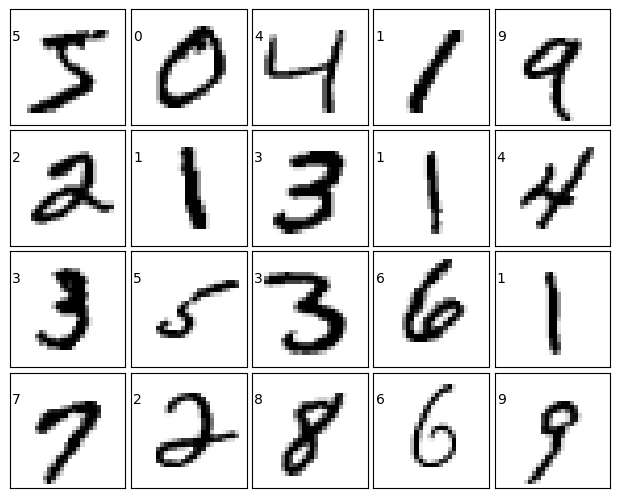

In [5]:
fig = plt.figure(figsize=(6, 6))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)

for i in range(20):
    ax = fig.add_subplot(5, 5, i + 1, xticks=[], yticks=[])
    ax.imshow(X_train[i], cmap=plt.cm.binary, interpolation='nearest')
    # label the image with the target value
    ax.text(0, 7, str(y_train[i]))

In [8]:
# Reshaping the dataset
X_train = X_train.reshape(60000, 784)
X_test = X_test.reshape(10000, 784)

# Change integers to 32-bit floating point numbers
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

print("Training matrix shape", X_train.shape)
print("Testing matrix shape", X_test.shape)

Training matrix shape (60000, 784)
Testing matrix shape (10000, 784)


In [9]:
# Apply standarization to both train and test data
from sklearn.preprocessing import StandardScaler
X_train = StandardScaler().fit_transform(X_train)
X_test = StandardScaler().fit_transform(X_test)

In [10]:
# initializing the pca
from sklearn.decomposition import PCA

In [11]:
pca = PCA(n_components=.95)
pca.fit(X_train)

PCA(n_components=0.95)

In [12]:
print(f'Total number of components used after PCA : {pca.n_components_}')

Total number of components used after PCA : 331


In [13]:
# Calculate eigenvalues
eigenvalues = pca.explained_variance_

In [14]:
# Normalize eigenvalues
normalized_eigenvalues = eigenvalues / np.sum(eigenvalues)

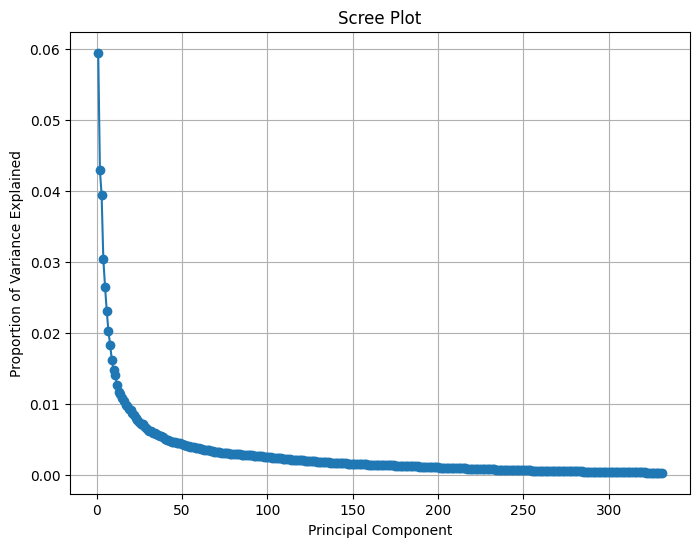

In [15]:
# Plot scree plot
plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, len(normalized_eigenvalues) + 1), normalized_eigenvalues, marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.title('Scree Plot')
plt.grid(True)
plt.show()

In [16]:
# Select components using Kaiser's criterion (e.g., eigenvalue > 1)
kaiser_threshold = 1
significant_components = np.where(eigenvalues > kaiser_threshold)[0] + 1
print("Significant components (Kaiser's criterion):", significant_components)

Significant components (Kaiser's criterion): [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164]


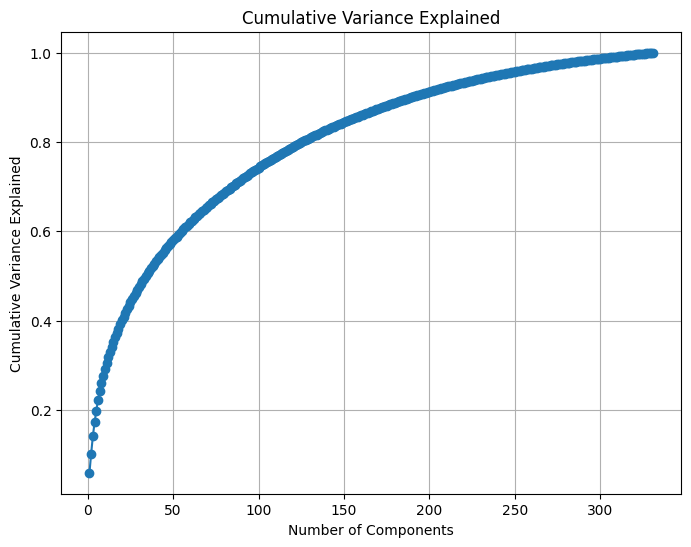

In [17]:
# Calculate cumulative variance explained
cumulative_variance = np.cumsum(normalized_eigenvalues)
plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained')
plt.grid(True)
plt.show()

In [18]:
# Interpret components
for i, component in enumerate(pca.components_):
    print(f"Principal Component {i+1}:")
    for j, feature in enumerate(component):
        print(f"\tFeature {j+1}: {feature:.3f}")

Principal Component 1:
	Feature 1: -0.000
	Feature 2: 0.000
	Feature 3: -0.000
	Feature 4: -0.000
	Feature 5: 0.000
	Feature 6: -0.000
	Feature 7: -0.000
	Feature 8: -0.000
	Feature 9: -0.000
	Feature 10: 0.000
	Feature 11: 0.000
	Feature 12: 0.000
	Feature 13: -0.000
	Feature 14: 0.000
	Feature 15: 0.000
	Feature 16: 0.000
	Feature 17: -0.000
	Feature 18: -0.000
	Feature 19: -0.000
	Feature 20: -0.000
	Feature 21: -0.000
	Feature 22: -0.000
	Feature 23: -0.000
	Feature 24: -0.000
	Feature 25: -0.000
	Feature 26: -0.000
	Feature 27: -0.000
	Feature 28: -0.000
	Feature 29: -0.000
	Feature 30: -0.000
	Feature 31: -0.000
	Feature 32: -0.000
	Feature 33: 0.000
	Feature 34: 0.001
	Feature 35: 0.001
	Feature 36: 0.002
	Feature 37: 0.003
	Feature 38: 0.004
	Feature 39: 0.004
	Feature 40: 0.004
	Feature 41: 0.003
	Feature 42: 0.003
	Feature 43: 0.002
	Feature 44: 0.002
	Feature 45: 0.001
	Feature 46: 0.001
	Feature 47: 0.000
	Feature 48: -0.001
	Feature 49: -0.000
	Feature 50: 0.000
	Feature 5

In [19]:
train_img = pca.transform(X_train)
test_img = pca.transform(X_test)

print(f'train_img shape : {train_img.shape}')
print(f'test_img shape : {test_img.shape}')

train_img shape : (60000, 331)
test_img shape : (10000, 331)


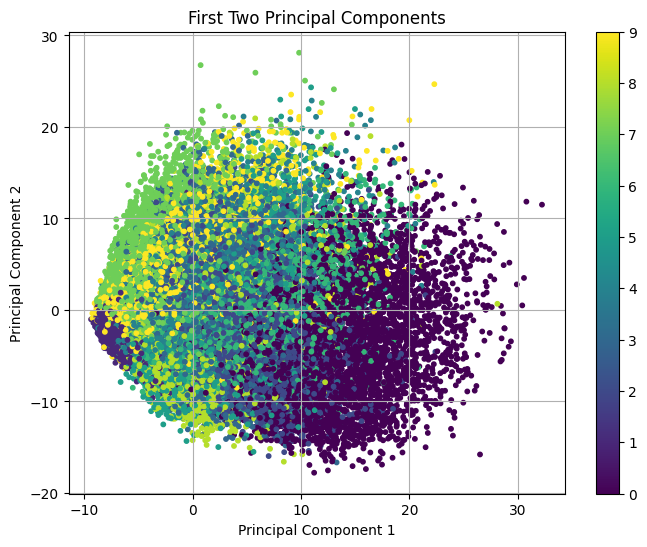

In [20]:
#graphing the first 2 principal components
plt.figure(figsize=(8, 6))
plt.scatter(train_img[:, 0], train_img[:, 1], c=y_train, cmap='viridis', s=10)
plt.colorbar()
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('First Two Principal Components')
plt.grid(True)
plt.show()

C:\Users\saidi\AppData\Local\Temp\ipykernel_3164\3633745844.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(train_img[:, 0], shade=True, color='r', label='Principal Component 1')
C:\Users\saidi\AppData\Local\Temp\ipykernel_3164\3633745844.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(train_img[:, 1], shade=True, color='b', label='Principal Component 2')


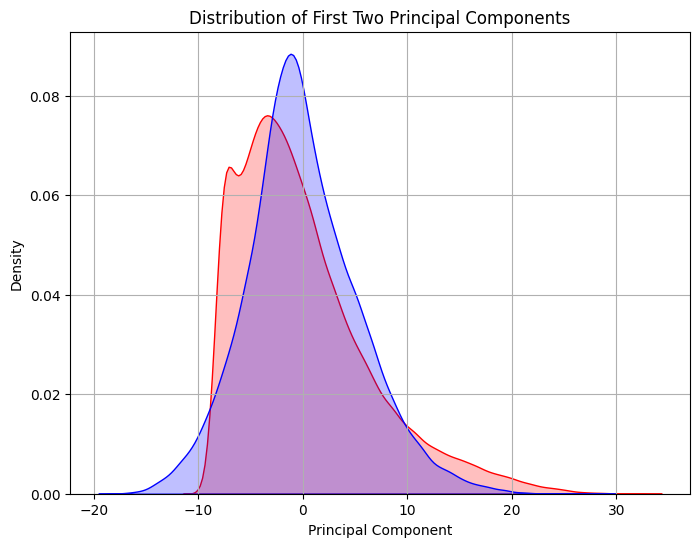

In [21]:
#plot for the distribution function
plt.figure(figsize=(8, 6))
sns.kdeplot(train_img[:, 0], shade=True, color='r', label='Principal Component 1')
sns.kdeplot(train_img[:, 1], shade=True, color='b', label='Principal Component 2')
plt.xlabel('Principal Component')
plt.ylabel('Density')
plt.title('Distribution of First Two Principal Components')
plt.grid(True)
plt.show()

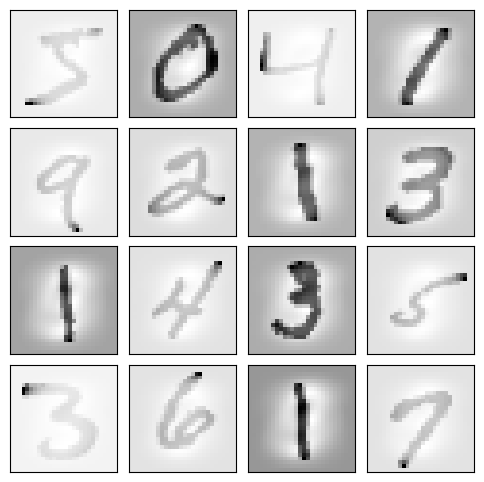

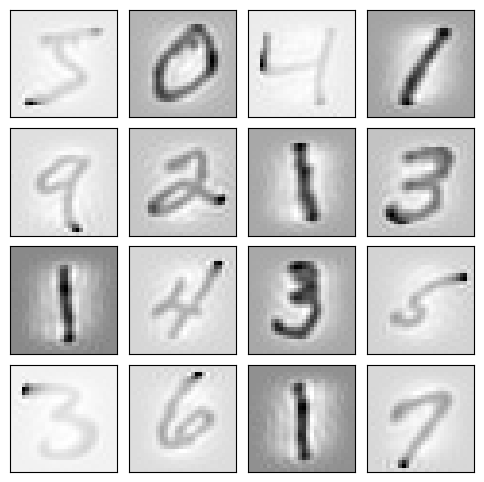

In [22]:
#plot for similuation of the original image
def plot_digits(data):
    fig, axes = plt.subplots(4, 4, figsize=(6, 6), subplot_kw={'xticks':[], 'yticks':[]}, gridspec_kw=dict(hspace=0.1, wspace=0.1))
    for i, ax in enumerate(axes.flat):
        ax.imshow(data[i].reshape(28, 28), cmap='binary', interpolation='nearest')
    plt.show()

plot_digits(X_train)
plot_digits(pca.inverse_transform(train_img))


In [23]:
#Ranking changes by threshold
threshold = 0.5
significant_components = np.where(cumulative_variance < threshold)[0] + 1
print(f"Number of components for {threshold} threshold: {significant_components[-1]}")


Number of components for 0.5 threshold: 34


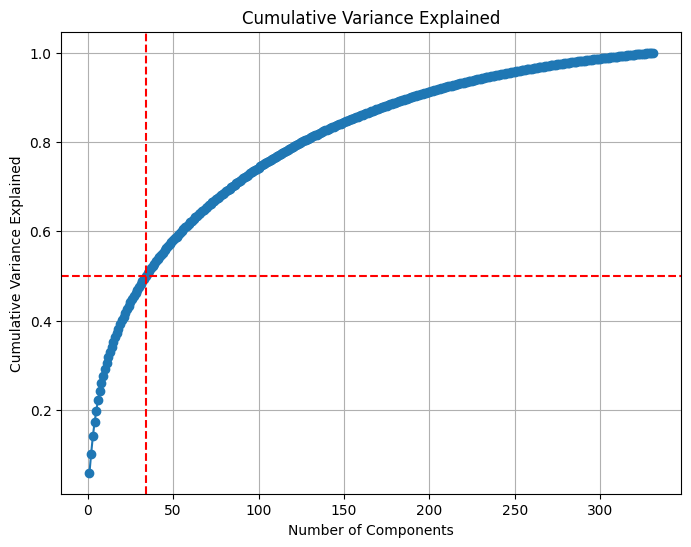

In [24]:
#Ranking changes by threshold graph
plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.axhline(y=threshold, color='r', linestyle='--')
plt.axvline(x=significant_components[-1], color='r', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained')
plt.grid(True)
plt.show()

c:\Users\saidi\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\saidi\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/st

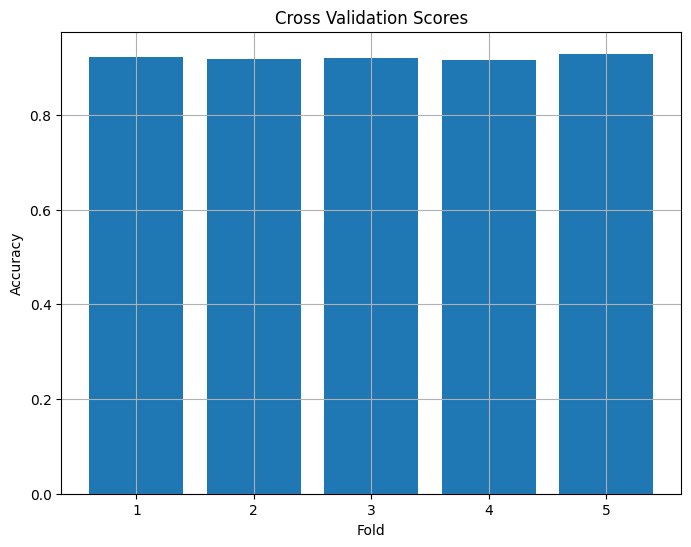

In [25]:
#cross validation of each digit graph
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
plt.figure(figsize=(8, 6))
scores = cross_val_score(LogisticRegression(), train_img, y_train, cv=5)
plt.bar(np.arange(1, 6), scores)
plt.xlabel('Fold')
plt.ylabel('Accuracy')
plt.title('Cross Validation Scores')
plt.grid(True)
plt.show()

c:\Users\saidi\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\saidi\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/st

Mean error rate: 0.07896666666666674


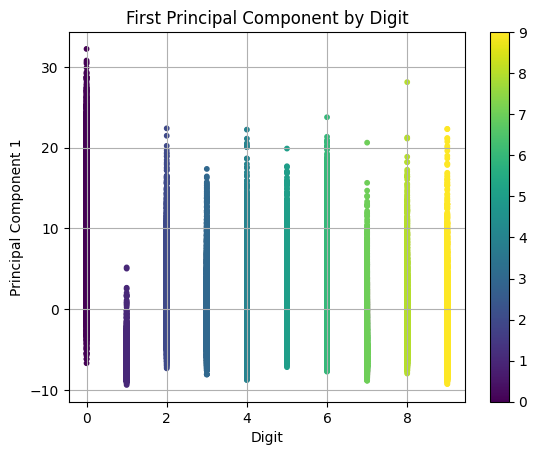

In [27]:
#cross validation of digit 0 show mean error rate
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
scores = cross_val_score(LogisticRegression(), train_img, y_train, cv=5)
print(f"Mean error rate: {1 - scores.mean()}")
plt.scatter(y_train, train_img[:, 0], c=y_train, cmap='viridis', s=10)
plt.colorbar()
plt.xlabel('Digit')
plt.ylabel('Principal Component 1')
plt.title('First Principal Component by Digit')
plt.grid(True)
plt.show()

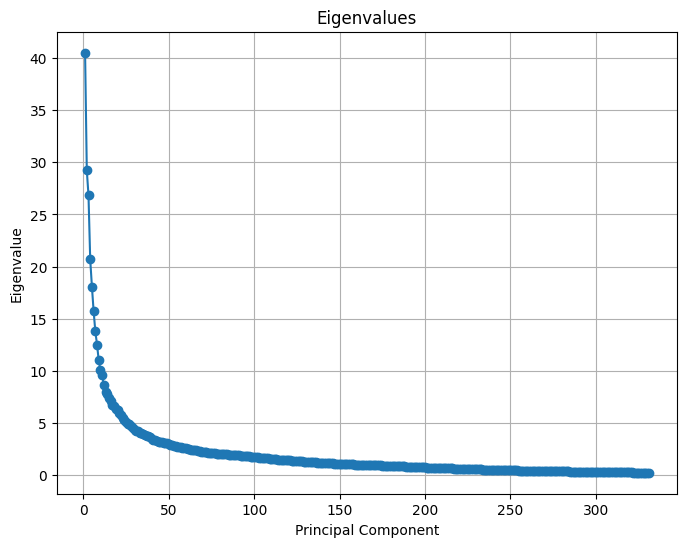

In [28]:
#eigen values plot for the first digits
plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, len(eigenvalues) + 1), eigenvalues, marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Eigenvalue')
plt.title('Eigenvalues')
plt.grid(True)
plt.show()

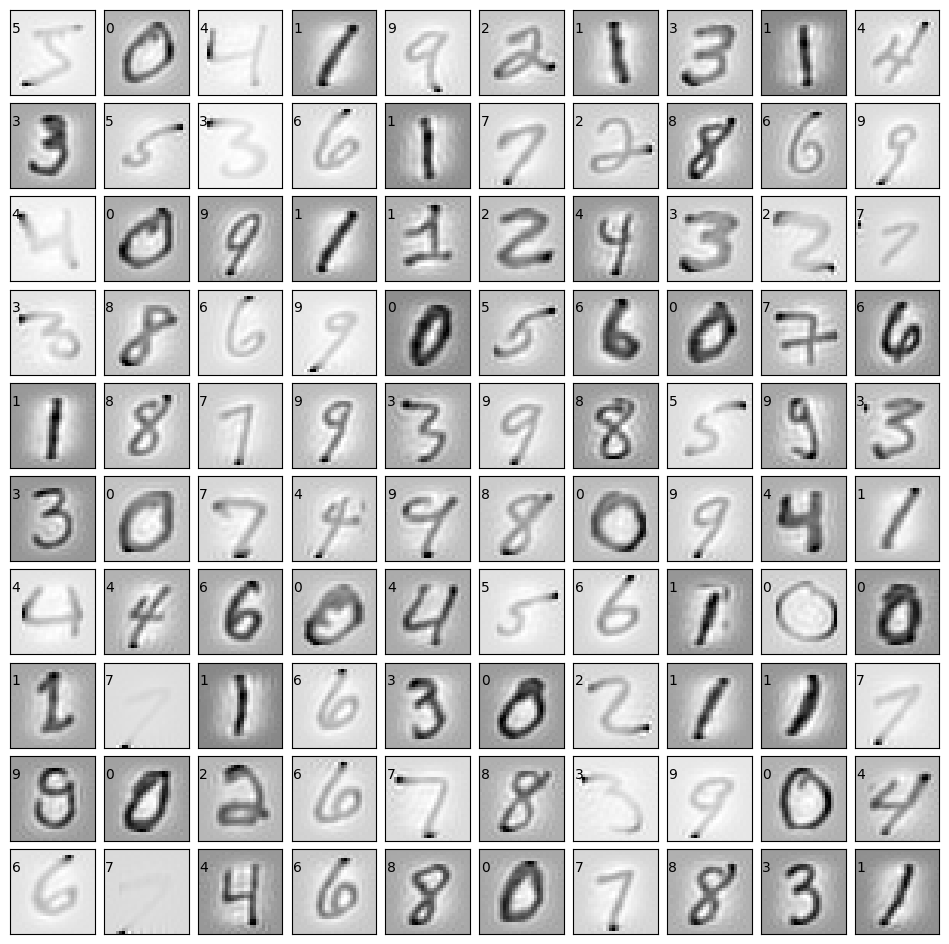

In [31]:
#show subplots for each digit
fig, axes = plt.subplots(10, 10, figsize=(12, 12), subplot_kw={'xticks':[], 'yticks':[]}, gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i, ax in enumerate(axes.flat):
    ax.imshow(pca.inverse_transform(train_img[i]).reshape(28, 28), cmap='binary', interpolation='nearest')
    ax.text(0, 7, str(y_train[i]))
plt.show()

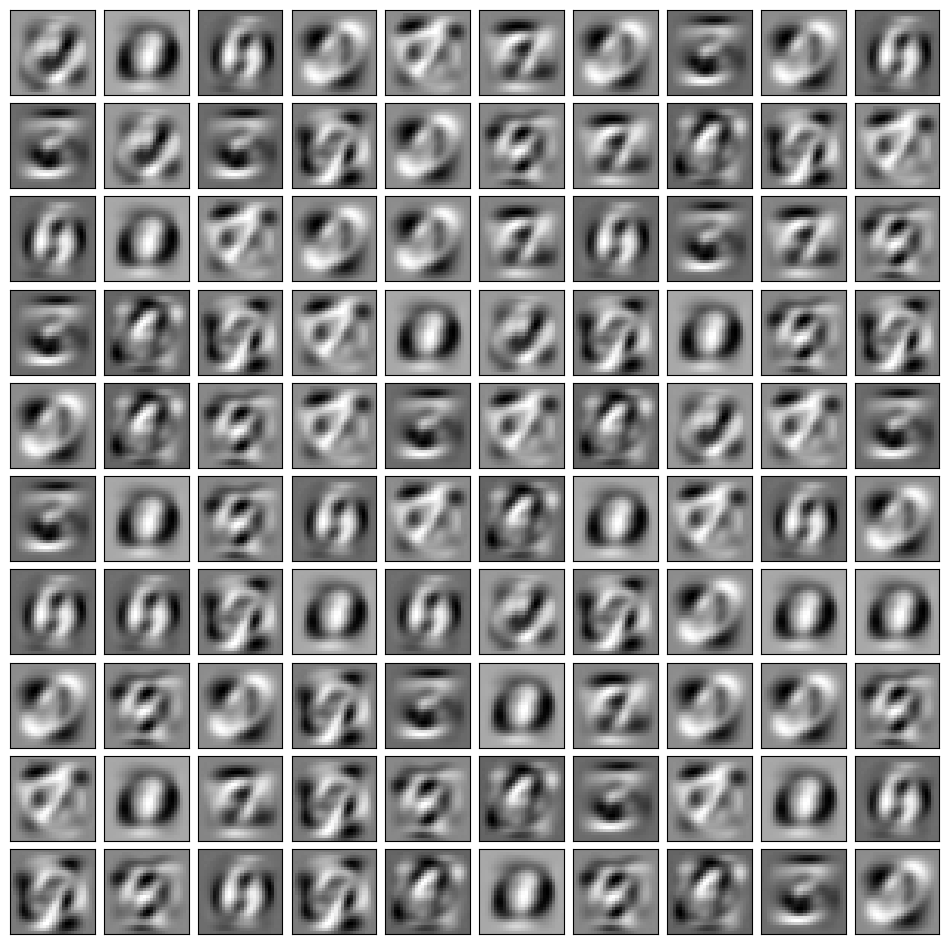

In [32]:
#show subplots for pca components for each digit
fig, axes = plt.subplots(10, 10, figsize=(12, 12), subplot_kw={'xticks':[], 'yticks':[]}, gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i, ax in enumerate(axes.flat):
    ax.imshow(pca.components_[y_train[i]].reshape(28, 28), cmap='binary', interpolation='nearest')
plt.show()

In [34]:
from sklearn.neural_network import MLPClassifier

In [35]:
# all parameters not specified are set to their defaults
# default solver is incredibly slow thats why we change it
# solver = 'lbfgs'
clf = MLPClassifier(solver = 'lbfgs')

In [36]:
clf.fit(train_img, y_train)

MLPClassifier(solver='lbfgs')

In [37]:
print('Training score : ', clf.score(train_img, y_train))
print('Testing score  : ', clf.score(test_img, y_test))

Training score :  1.0
Testing score  :  0.974


In [38]:
# The data used is the original train and test data
X_train.shape

(60000, 784)

In [39]:
from sklearn.decomposition import PCA
list_variance = [.85, .90, .95, .99]
train_data = []
test_data = []
i = 0

for variance in list_variance:
  print(f'Dataset dimensional reduction with {variance*100}% variance retained')
  print('='*60)

  pca = PCA(n_components=variance)
  pca.fit(X_train)

  train_data.append(pca.transform(X_train))
  test_data.append(pca.transform(X_test))

  print(f'> Total number of components for variance {variance} : {pca.n_components_}')
  print(f'> Train data shape : {train_data[i].shape}')
  print(f'> Test data shape  : {test_data[i].shape}\n')
  i += 1

Dataset dimensional reduction with 85.0% variance retained
> Total number of components for variance 0.85 : 185
> Train data shape : (60000, 185)
> Test data shape  : (10000, 185)

Dataset dimensional reduction with 90.0% variance retained
> Total number of components for variance 0.9 : 236
> Train data shape : (60000, 236)
> Test data shape  : (10000, 236)

Dataset dimensional reduction with 95.0% variance retained
> Total number of components for variance 0.95 : 331
> Train data shape : (60000, 331)
> Test data shape  : (10000, 331)

Dataset dimensional reduction with 99.0% variance retained
> Total number of components for variance 0.99 : 543
> Train data shape : (60000, 543)
> Test data shape  : (10000, 543)



In [40]:
from sklearn.neural_network import MLPClassifier
import time
import warnings
warnings.filterwarnings("ignore")

In [41]:
start_time = time.time()
clf = MLPClassifier(solver = 'lbfgs', max_iter=100)
clf.fit(X_train, y_train)
end_time = time.time()

print(f'Control result with original dataset (100% variance)')
print('='*60)
print(f'Training score : ', clf.score(X_train, y_train))
print(f'Testing score  : ', clf.score(X_test, y_test))
print(f'Time (seconds) : {end_time - start_time} \n')

Control result with original dataset (100% variance)
Training score :  1.0
Testing score  :  0.9714
Time (seconds) : 85.89328718185425 



In [42]:
for i in range(0, 4):
  start_time = time.time()
  clf = MLPClassifier(solver = 'lbfgs', max_iter=100)
  clf.fit(train_data[i], y_train)
  end_time = time.time()

  print(f'Dataset with {list_variance[i]*100}% variance retained')
  print('='*40)
  print(f'Training score : ', clf.score(train_data[i], y_train))
  print(f'Testing score  : ', clf.score(test_data[i], y_test))
  print(f'Time (seconds) : {end_time - start_time} \n')

Dataset with 85.0% variance retained
Training score :  0.9999833333333333
Testing score  :  0.9718
Time (seconds) : 69.63362860679626 

Dataset with 90.0% variance retained
Training score :  1.0
Testing score  :  0.972
Time (seconds) : 41.48310160636902 

Dataset with 95.0% variance retained
Training score :  1.0
Testing score  :  0.9741
Time (seconds) : 46.625383138656616 

Dataset with 99.0% variance retained
Training score :  1.0
Testing score  :  0.9717
Time (seconds) : 57.41857051849365 



In [43]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit

def plot_learning_curve(estimator, title, X, y, axes=None, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    if axes is None:
        _, axes = plt.subplots(1, 2, figsize=(8, 5))

    axes[0].set_title(title)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel("Training examples")
    axes[0].set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = \
        learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs,
                       train_sizes=train_sizes,
                       return_times=True)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].grid()
    axes[0].fill_between(train_sizes, train_scores_mean - train_scores_std,
                         train_scores_mean + train_scores_std, alpha=0.1,
                         color="r")
    axes[0].fill_between(train_sizes, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1,
                         color="g")
    axes[0].plot(train_sizes, train_scores_mean, 'o-', color="r",
                 label="Training score")
    axes[0].plot(train_sizes, test_scores_mean, 'o-', color="g",
                 label="Cross-validation score")
    axes[0].legend(loc="best")

    # Plot fit_time vs score
    axes[1].grid()
    axes[1].plot(fit_times_mean, test_scores_mean, 'o-')
    axes[1].fill_between(fit_times_mean, test_scores_mean - test_scores_std,
                         test_scores_mean + test_scores_std, alpha=0.1)
    axes[1].set_xlabel("fit_times")
    axes[1].set_ylabel("Score")
    axes[1].set_title("Performance of the model")

    return plt

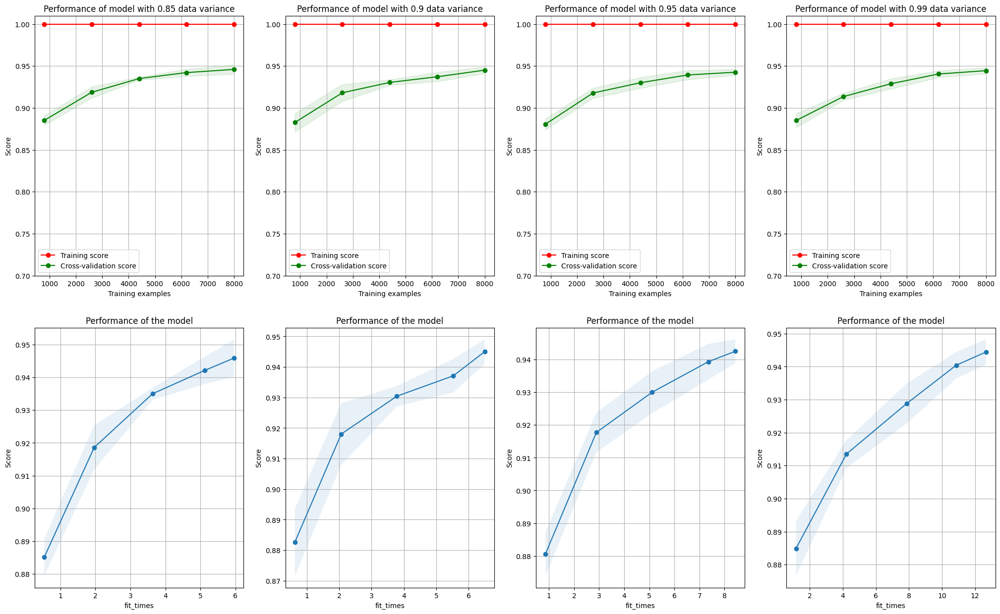

In [44]:
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)

fig, axes = plt.subplots(2, 4, figsize=(25, 15))

for i in range(0,4):
  title = "Performance of model with " + str(list_variance[i]) + " data variance"
  estimator = MLPClassifier(solver = 'lbfgs', max_iter=100)
  plot_learning_curve(estimator, title, test_data[i], y_test, axes=axes[:, i],
                        ylim=(0.7, 1.01), cv=cv, n_jobs=-1)

plt.show()

In [45]:
# Calculate component reduction percentage

components = [185, 236, 331, 543, 784]
components_reduction = []

for cc in components:
  z = (1.0 - (cc / 784)) * 100
  z = round(z, 2)
  components_reduction.append(z)

components_reduction

[76.4, 69.9, 57.78, 30.74, 0.0]

In [46]:
# Calculate training time reduction percentage

train_time = [43.96, 49.2, 54.9,64.47, 76.19]
train_time_reduction = []

for time in train_time:
  reduction = (1.0 - (time / 76.19)) * 100
  reduction = round(reduction, 2)
  train_time_reduction.append(reduction)

train_time_reduction

[42.3, 35.42, 27.94, 15.38, 0.0]

In [47]:
# Calculate accuracy difference

accuracy = [0.9722, 0.9744, 0.9733, 0.9735, 0.9744]
accuracy_diff = []

for acc in accuracy:
  x = 0.9744 - acc
  x = round(x, 4)
  accuracy_diff.append(x)

accuracy_diff

[0.0022, 0.0, 0.0011, 0.0009, 0.0]

In [48]:
result = {'Data Variance' : ['85%', '90%', '95%', '99%', '100%'],
          'Components' : components,
          'Components Reduction (%)' : components_reduction,
          'Accuracy' : accuracy,
          'Accuracy Difference' : accuracy_diff,
          'Train Time': train_time,
          'Train time Reduction (%)' : train_time_reduction,
          }
res_df = pd.DataFrame(result)
res_df

,Data Variance,Components,Components Reduction (%),Accuracy,Accuracy Difference,Train Time,Train time Reduction (%)
0,85%,185,76.40,0.9722,0.0022,43.96,42.30
1,90%,236,69.90,0.9744,0.0000,49.20,35.42
2,95%,331,57.78,0.9733,0.0011,54.90,27.94
3,99%,543,30.74,0.9735,0.0009,64.47,15.38
4,100%,784,0.00,0.9744,0.0000,76.19,0.00


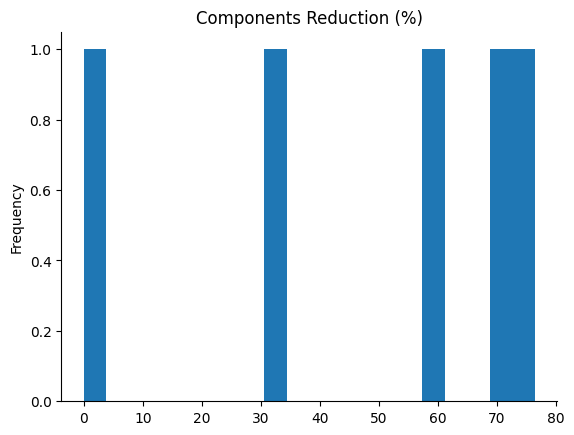

In [49]:
from matplotlib import pyplot as plt
res_df['Components Reduction (%)'].plot(kind='hist', bins=20, title='Components Reduction (%)')
plt.gca().spines[['top', 'right',]].set_visible(False)

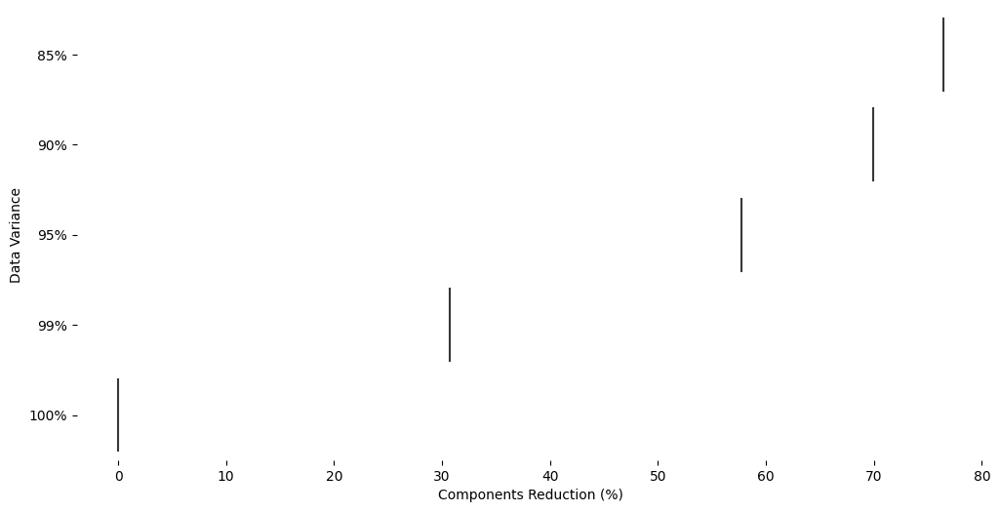

In [50]:
from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(res_df['Data Variance'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(res_df, x='Components Reduction (%)', y='Data Variance', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

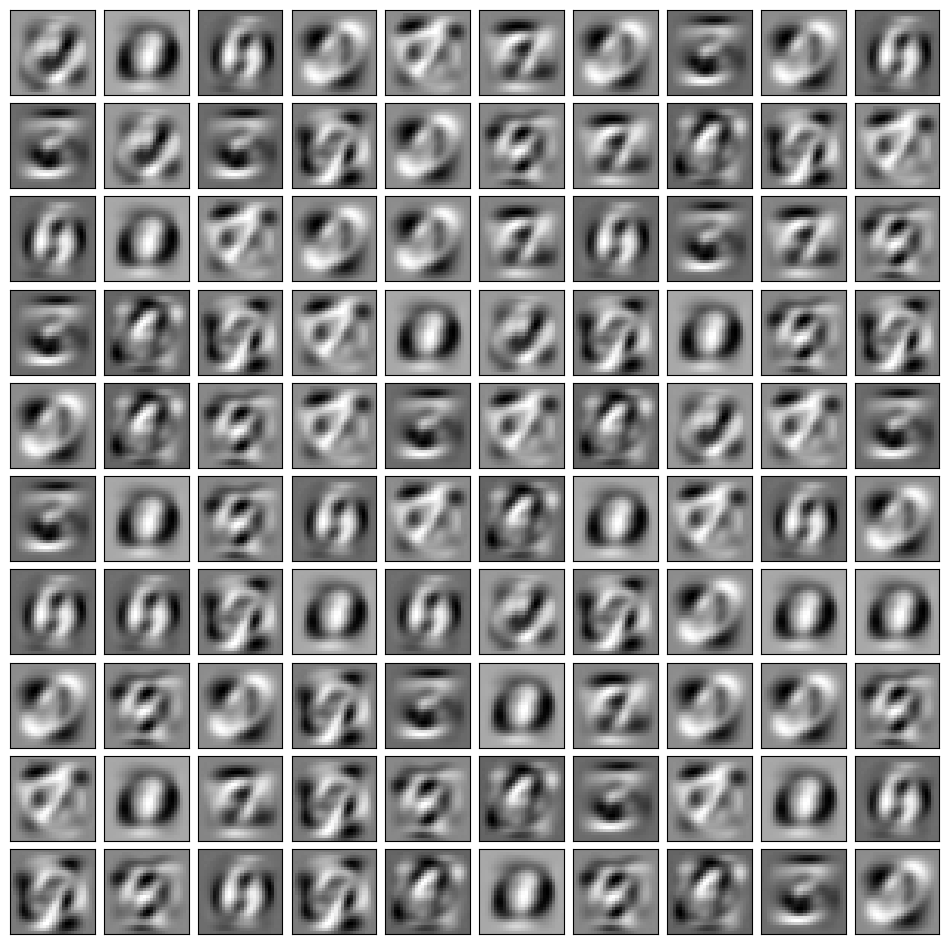

In [51]:
#show subplots for pca components for each digit
fig, axes = plt.subplots(10, 10, figsize=(12, 12), subplot_kw={'xticks':[], 'yticks':[]}, gridspec_kw=dict(hspace=0.1, wspace=0.1))
for i, ax in enumerate(axes.flat):
    ax.imshow(pca.components_[y_train[i]].reshape(28, 28), cmap='binary', interpolation='nearest')
plt.show()

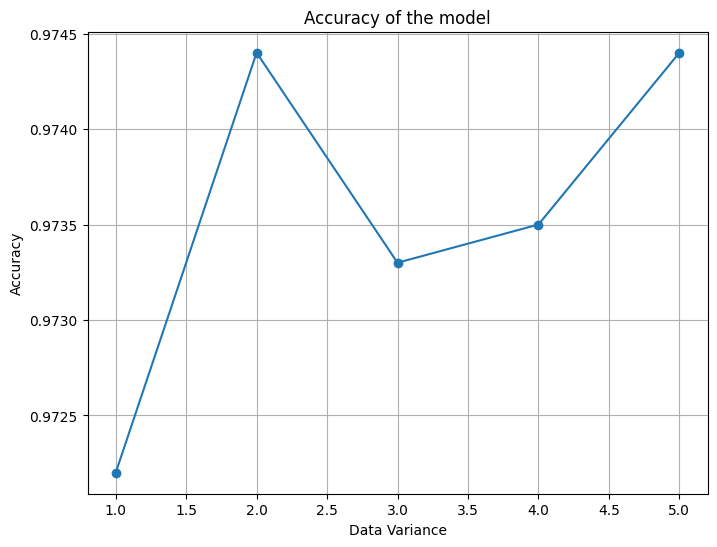

In [53]:
#accuracy of the model plot
plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, len(accuracy) + 1), accuracy, marker='o')
plt.xlabel('Data Variance')
plt.ylabel('Accuracy')
plt.title('Accuracy of the model')
plt.grid(True)
plt.show()

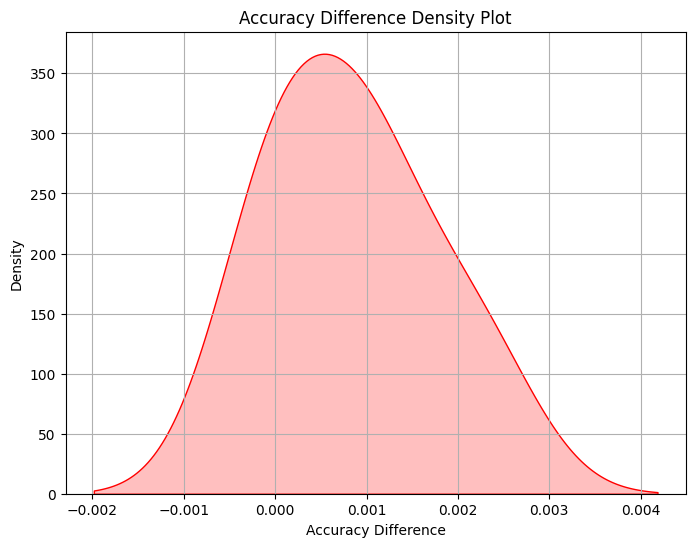

In [54]:
#density plot for the accuracy difference
plt.figure(figsize=(8, 6))
sns.kdeplot(accuracy_diff, shade=True, color='r')
plt.xlabel('Accuracy Difference')
plt.ylabel('Density')
plt.title('Accuracy Difference Density Plot')
plt.grid(True)
plt.show()

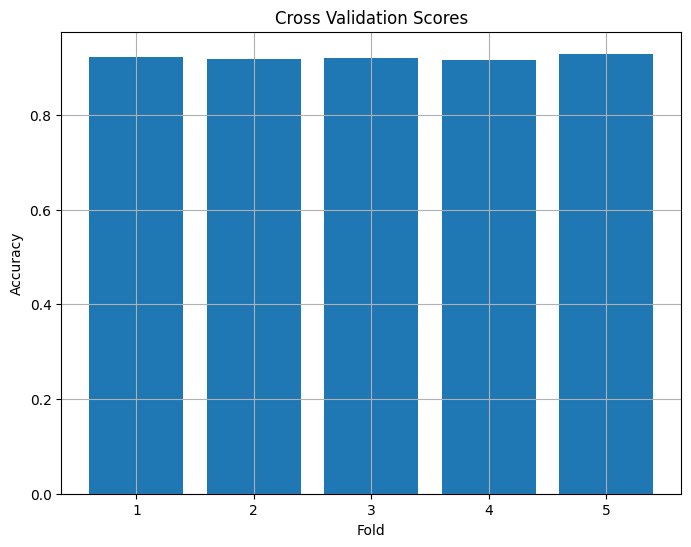

In [56]:
#cross validation of each digit graph
plt.figure(figsize=(8, 6))
scores = cross_val_score(LogisticRegression(), train_img, y_train, cv=5)
plt.bar(np.arange(1, 6), scores)
plt.xlabel('Fold')
plt.ylabel('Accuracy')
plt.title('Cross Validation Scores')
plt.grid(True)
plt.show()

Mean error rate: 0.07896666666666674


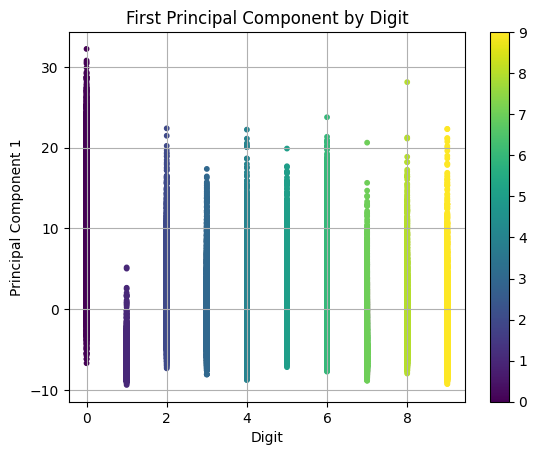

In [58]:
#cross validation of digit 0 show mean error rate
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
scores = cross_val_score(LogisticRegression(), train_img, y_train, cv=5)
print(f"Mean error rate: {1 - scores.mean()}")
plt.scatter(y_train, train_img[:, 0], c=y_train, cmap='viridis', s=10)
plt.colorbar()
plt.xlabel('Digit')
plt.ylabel('Principal Component 1')
plt.title('First Principal Component by Digit')
plt.grid(True)
plt.show()

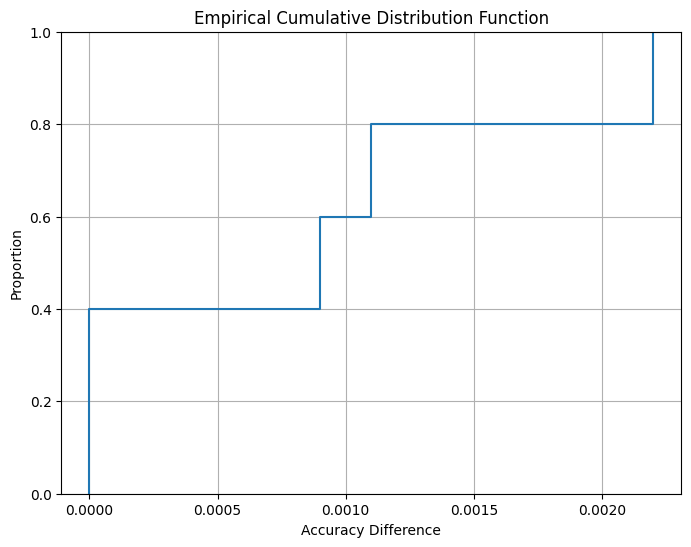

In [60]:
#emphierical cumulative distribution function
plt.figure(figsize=(8, 6))
sns.ecdfplot(accuracy_diff)
plt.xlabel('Accuracy Difference')
plt.ylabel('Proportion')
plt.title('Empirical Cumulative Distribution Function')
plt.grid(True)
plt.show()

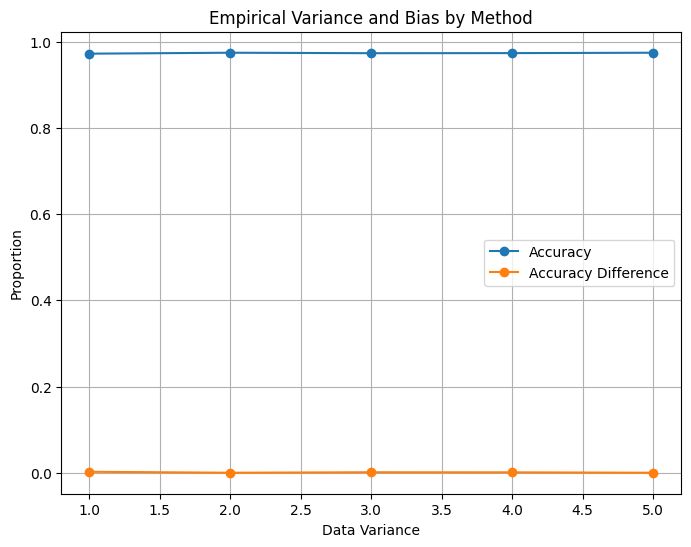

In [61]:
#Empirical Variance and Bias by Method
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, len(accuracy) + 1), accuracy, marker='o', label='Accuracy')
plt.plot(np.arange(1, len(accuracy) + 1), accuracy_diff, marker='o', label='Accuracy Difference')
plt.xlabel('Data Variance')
plt.ylabel('Proportion')
plt.title('Empirical Variance and Bias by Method')
plt.legend()
plt.grid(True)
plt.show()